In [1]:
import numpy as np
from scipy.signal import savgol_filter
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.transforms as transforms
import subprocess
import astropy.units as u
from synphot import SpectralElement, Empirical1D, SourceSpectrum, Observation

import os
gd_folder = os.getcwd()+"/../../Calculations/Gas_and_dust/"

import sys 
sys.path.append(gd_folder)
from polWaveDust import PolWaveDust
from polWaveGas import PolWaveGas

sys.path.append("../utility_functions/")
from objectProperties import ObjectProperties
from readExtrapolatedSpectra import ReadExtrapolatedSpectra

sys.path.append("../../Filter_Curves/")
from readBands import ReadBands

In [2]:
#Load the properties of the BHDs
op = ObjectProperties()

In [3]:
#Load the bands.
bands = ReadBands()
for bname in bands.bandnames:
    print(bname, bands.bp[bname].barlam(), bands.bp[bname].fwhm(), bands.bp[bname].rectwidth())

R_SPECIAL 6501.229535920617 Angstrom 1159.881393925198 Angstrom 1624.9974574790472 Angstrom
I_BESS 7908.260159757317 Angstrom 1335.7995225325858 Angstrom 1434.877194229439 Angstrom
v_HIGH 5531.766519253978 Angstrom 849.8588260783428 Angstrom 1195.1036753366664 Angstrom


In [4]:
#Load the spectra for each BHD, extended using the best-fit SED.
specs = ReadExtrapolatedSpectra()

Wavelength range for object W0019-1046 limited because of sky template
Spec-range: 3001.5 Angstrom - 5423.93 Angstrom
Sky-range: 3199.4 Angstrom - 6724.06 Angstrom
Wavelength range for object W0204-0506 limited because of sky template
Spec-range: 3786.2 Angstrom - 6672.70 Angstrom
Sky-range: 3789.3 Angstrom - 6682.76 Angstrom
Warning, 2 of 3161 bins contained negative fluxes; they have been set to zero.
Wavelength range for object W0831+0140 limited because of sky template
Spec-range: 3786.2 Angstrom - 6672.45 Angstrom
Sky-range: 3789.3 Angstrom - 6682.76 Angstrom
Warning, 2 of 3161 bins contained negative fluxes; they have been set to zero.


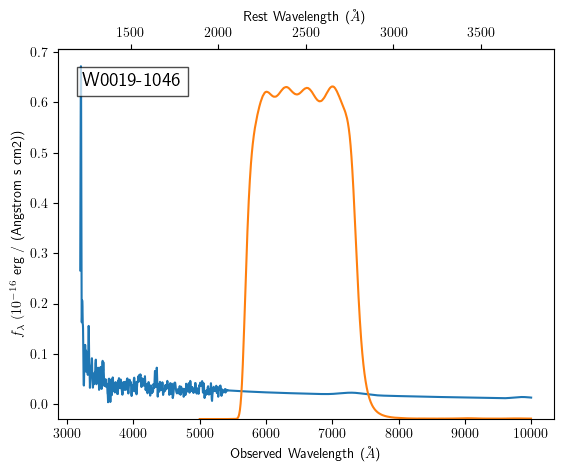

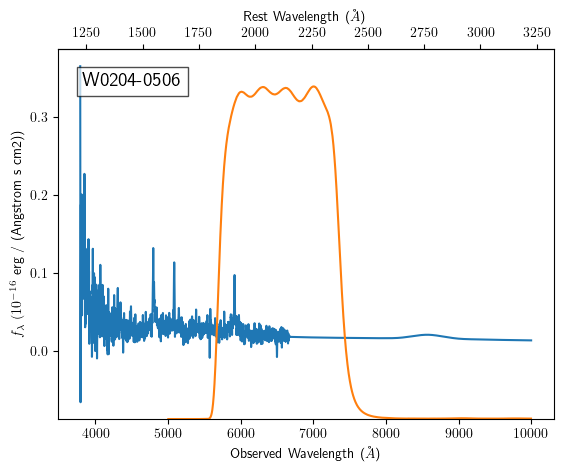

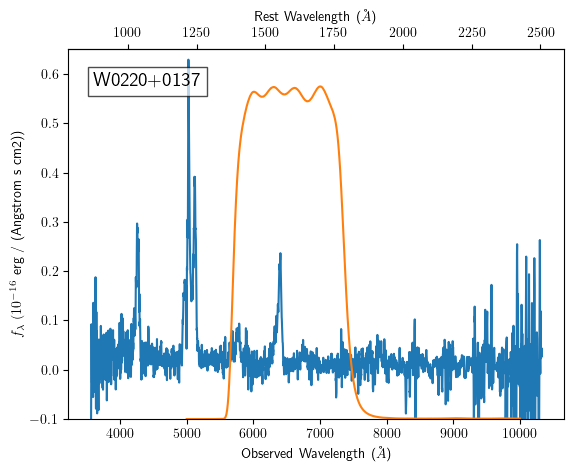

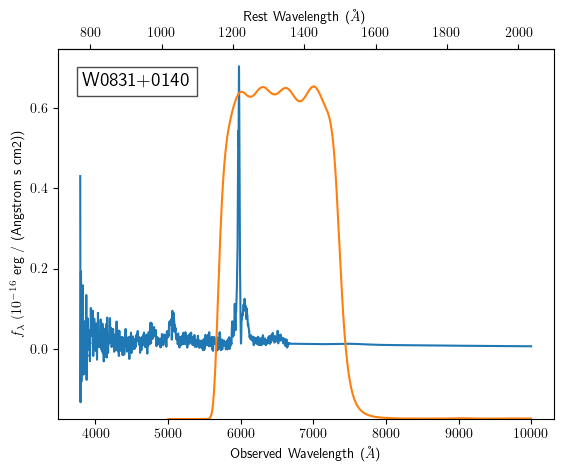

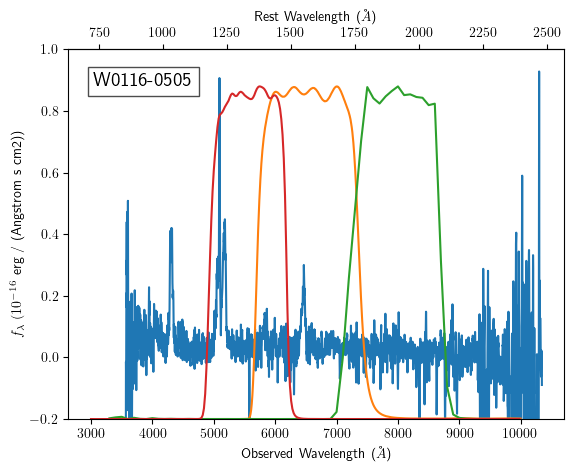

In [5]:
for wid in op.wids:

    full_spec = SourceSpectrum(Empirical1D, points=specs.lam_obs[wid], lookup_table=specs.flam[wid], keep_neg=True)

    fig, ax = plt.subplots(1)
    trans = transforms.blended_transform_factory(ax.transData, ax.transAxes)

    #Smooth the spectrum 
    flam_smooth = savgol_filter(specs.flam[wid], 11, 3)*1e16
    #ax.plot(spec.lam_obs/(1+spec.zspec), spec.flam, label=wid)
    ax.plot(specs.lam_obs[wid], flam_smooth, label=wid)

    #Add a secondary axis with the rest-frame wavelengths. 
    invert = lambda x:x/(1+op.z[wid]) 
    sax = ax.secondary_xaxis('top',functions=(invert, invert))

    #Plot the filtercurves
    for bname in op.pfrac[wid].keys():
        band = bands.bp[bname]
        ax.plot(band._model.points[0], 0.9*band._model.lookup_table/np.max(band._model.lookup_table), transform=trans)

    #Add a label with the object name
    ax.text(0.05, 0.9, wid, transform=ax.transAxes, bbox=dict(facecolor='white', edgecolor='black', alpha=0.7), fontsize=14)

    #Set the y-axis range for some objects. 
    if wid == "W0116-0505":
        ax.set_ylim([-0.2, 1.0])
    elif wid == "W0220+0137":
        ax.set_ylim([-0.1, 0.65])

    #Set the axis labels. 
    ax.set_xlabel(r"Observed Wavelength ($\AA$)")
    sax.set_xlabel(r"Rest Wavelength ($\AA$)")
    ax.set_ylabel(r"$f_{\lambda}~(10^{-16}$" + " {})".format(specs.flam[wid].unit))
    plt.show()


In [6]:
theta_angles = np.arange(0., 90., 2.5)
psi_angles = np.arange(0., 90., 2.5)

In [7]:
def plot_pol(p_bb, theta_angles, psi_angles, ymax=1.02, plot_fname=None, plot_label=None, ax=None, fig=None):

    #Create the figure
    if fig is None and ax is None:
        fig, ax = plt.subplots(figsize=(12,9))

    #Set the normalization for the color map. 
    #Norm = mpl.colors.LogNorm(vmin=theta_s_angles[0], vmax=theta_s_angles[-1])
    Norm = mpl.colors.Normalize(vmin=theta_angles[0], vmax=theta_angles[-1])

    #Set the color map
    cmap = mpl.cm.jet

    #Run through every inclination angle plotting the curves.
    for jtheta, theta in enumerate(theta_angles):
        #Set the color
        c = cmap(Norm(theta))
        #Plot
        im = ax.plot(psi_angles, p_bb[jtheta], color=c, linestyle='solid')

    #Set the ticks to point inwards.
    ax.tick_params(axis='both', direction='in', labelsize=14, top=True, right=True)

    #Draw a colorbar. 
    cb = fig.colorbar(mpl.cm.ScalarMappable(norm=Norm, cmap=cmap), ax=ax, pad=0.01, aspect=30)
    #cb.set_label(label=r'Inclination Angle $\theta_S$ (deg)', fontsize=20)
    cb.set_label(label=r'Inclination Angle $\eta$ (deg)', fontsize=20)
    cb.ax.tick_params(labelsize=14) 

    #Set the axes limits.
    ax.set_xlim([0, np.max(psi_angles)])
    ax.set_ylim([0, ymax])

    #Set the axes labels.
    ax.set_ylabel('Degree of Polarization', fontsize=20)
    ax.set_xlabel(r'Opening Half-Angle $\psi$ (deg)', fontsize=20)

    #Set the main label in the top right corner. 
    if plot_label is not None:
        ax.text(0.98, 0.9, plot_label, va='center', ha='right', transform=ax.transAxes, fontsize=26)

    #Show the plot.
    if plot_fname is not None:
        plt.savefig(plot_fname, dpi=300, bbox_inches='tight')
    else:
        #plt.show()
        pass

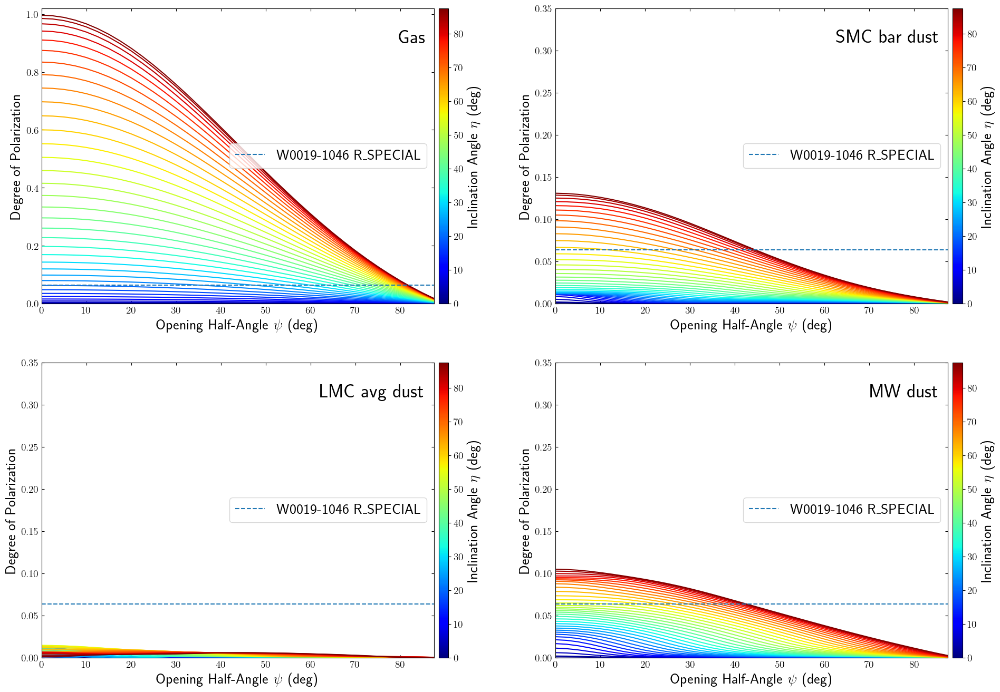

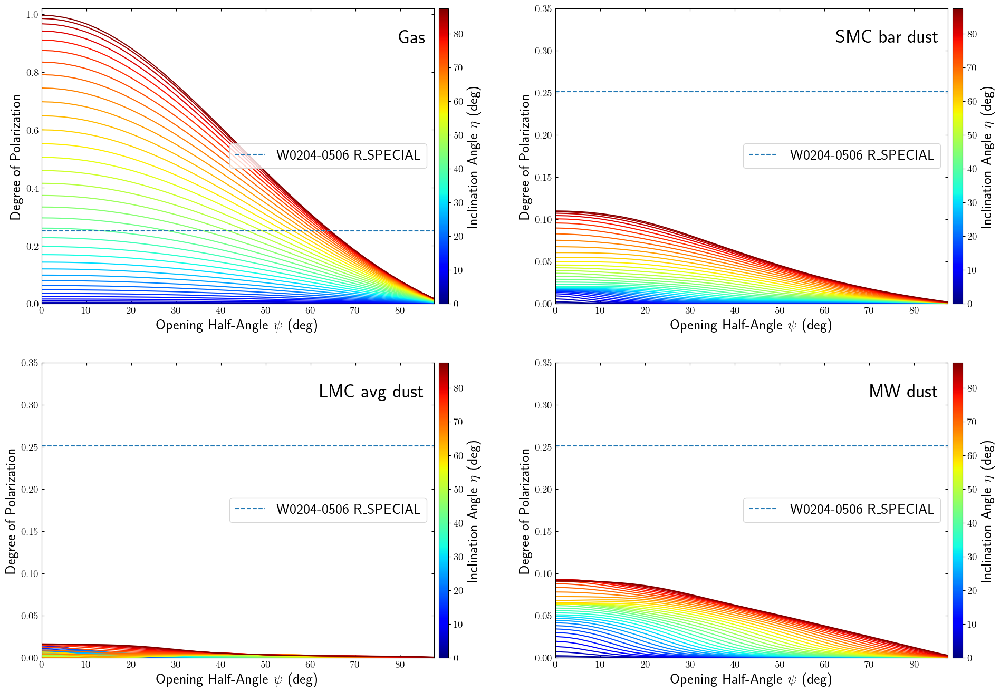

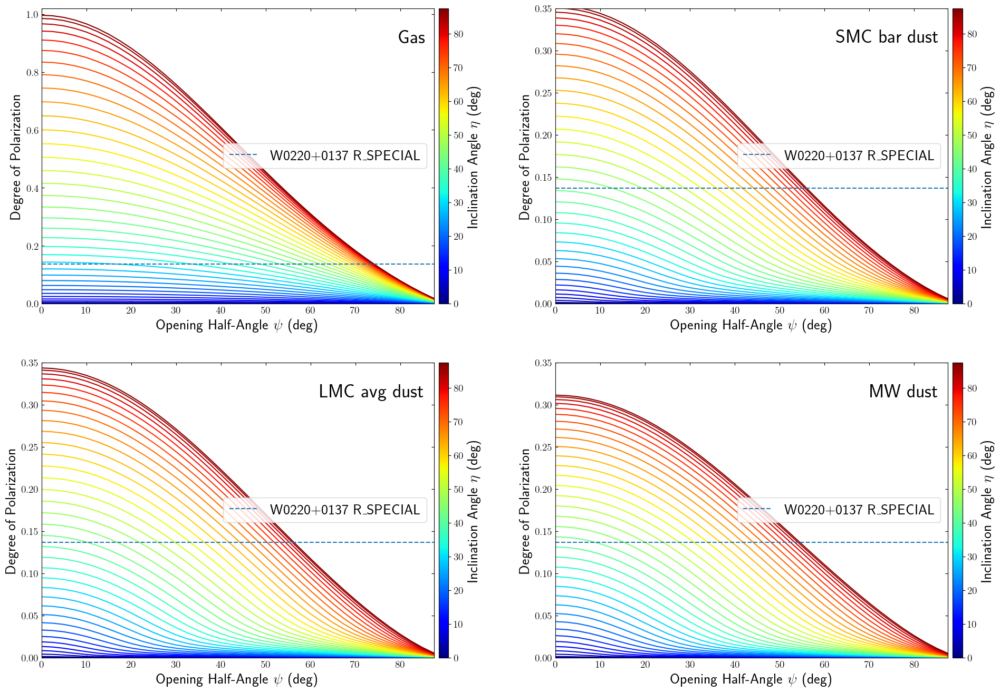

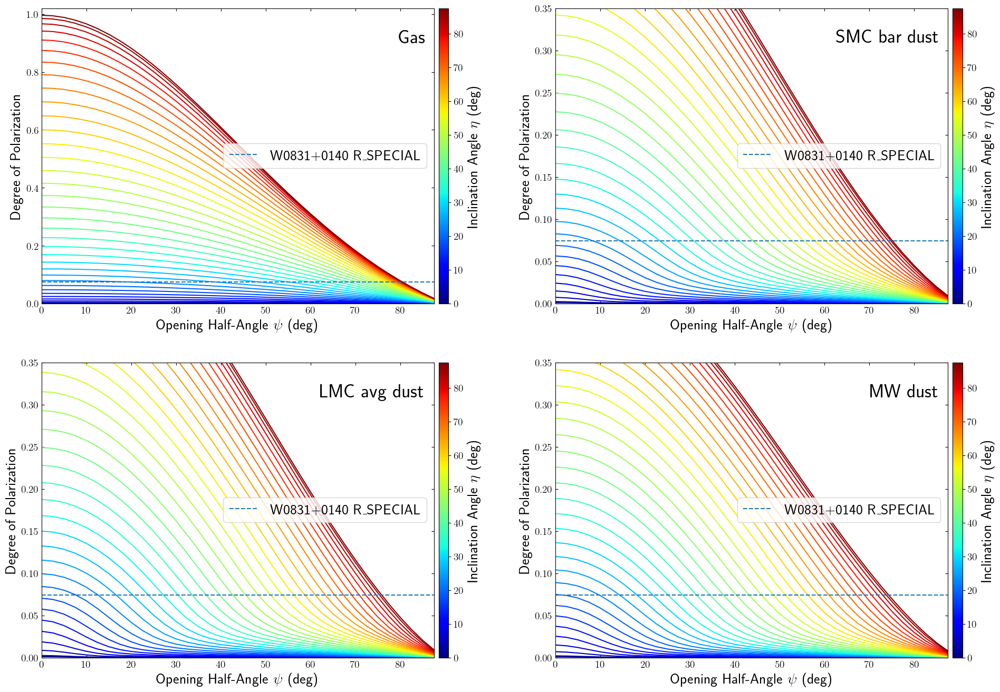

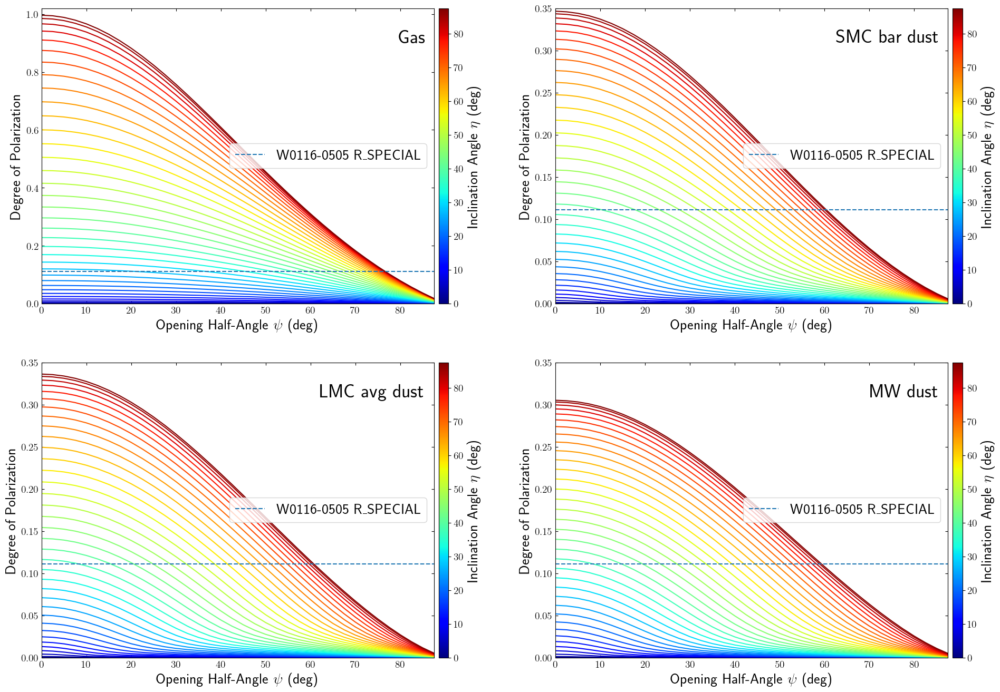

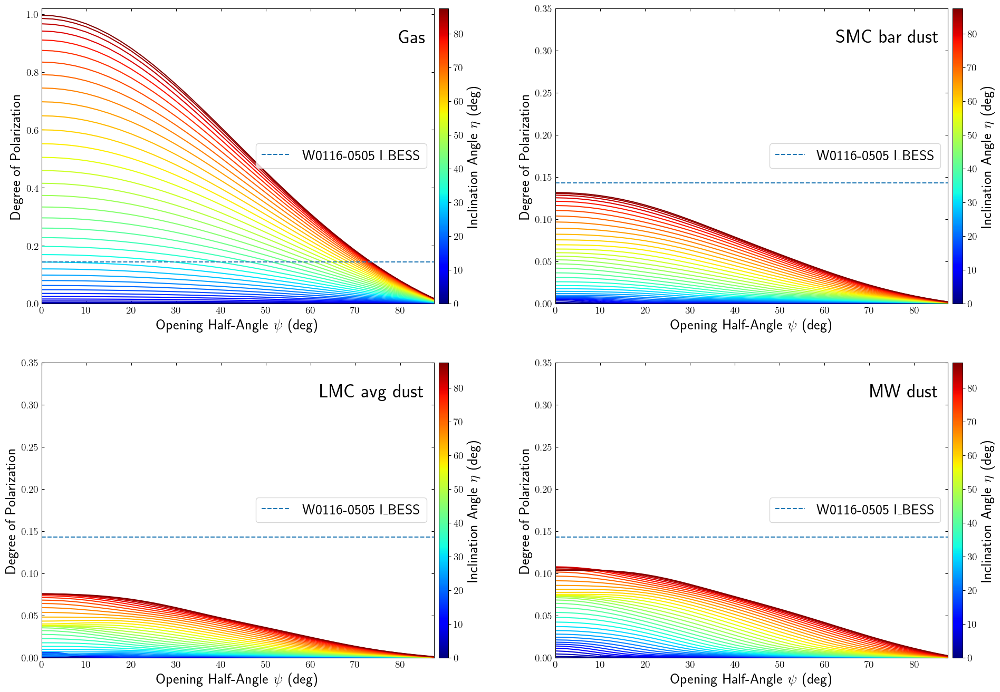

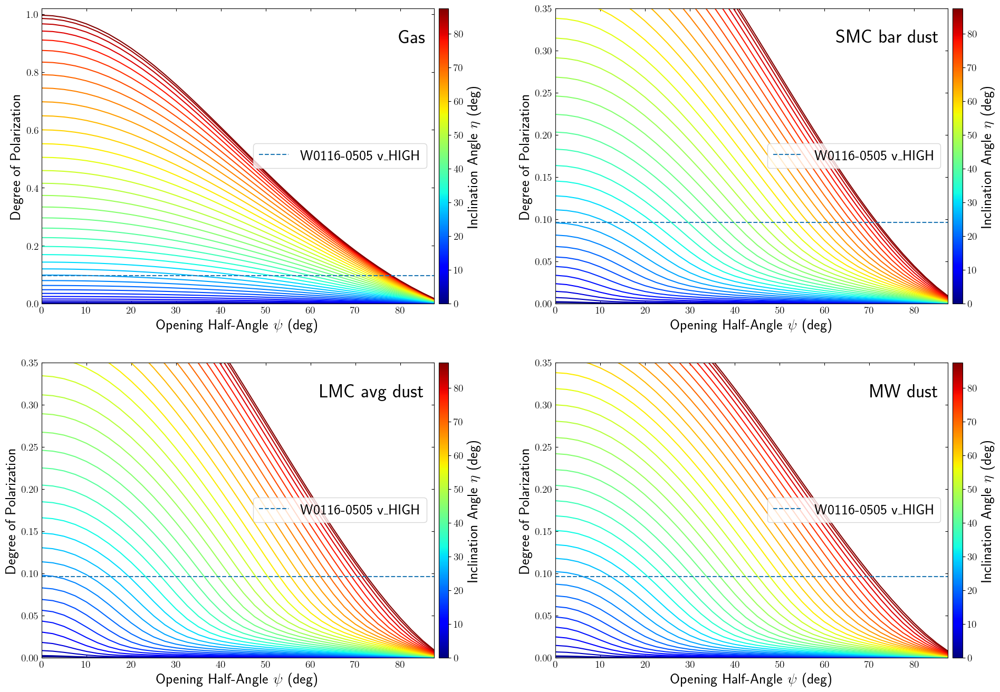

In [8]:
medium_types = ["Gas", "SMC", "LMC", "MW"]
plot_labels = ["Gas", "SMC bar dust", "LMC avg dust", "MW dust"]
fw = True
bw = True
suffix = "FWBW"
for wid in op.wids:
    for band in op.pfrac[wid].keys():
        fig, ax = plt.subplots(2,2,figsize=(24, 16))
        fig.subplots_adjust(wspace=0.1)
        ymax = [1.02, 0.35, 0.35, 0.35]
        for k, medium_type in enumerate(medium_types):
            if medium_type=="Gas":
                pw = PolWaveGas(fw=fw,bw=bw)
                psi_2d_grid, th_2d_grid = np.meshgrid(psi_angles, theta_angles)
                p_bb = pw.p((th_2d_grid, psi_2d_grid))
            else:
                pw = PolWaveDust(medium_type,fw=fw,bw=bw)
                p_bb = pw.p_bb(bands.bp[band], theta_angles, psi_angles, specs.lam_obs[wid], specs.flam[wid], specs.specs.sp[wid].zspec)
            plot_pol(p_bb, theta_angles, psi_angles, plot_fname=None, plot_label=plot_labels[k], ymax=ymax[k], fig=fig, ax=ax.flatten()[k])
            # #The detected polarization fraction. 
            # for key in pfrac.keys():
            puse = op.pfrac[wid][band]/100.
            ax.flatten()[k].plot([0, 90], [puse, puse], '--', label=wid+" "+band)
            ax.flatten()[k].legend(loc=7, fontsize=20)
        #plt.savefig("lowdens_combined_pol.{}.{}.{}.png".format(wid,band,suffix), dpi=100, bbox_inches='tight', transparent=False, facecolor='white')
        plt.show()

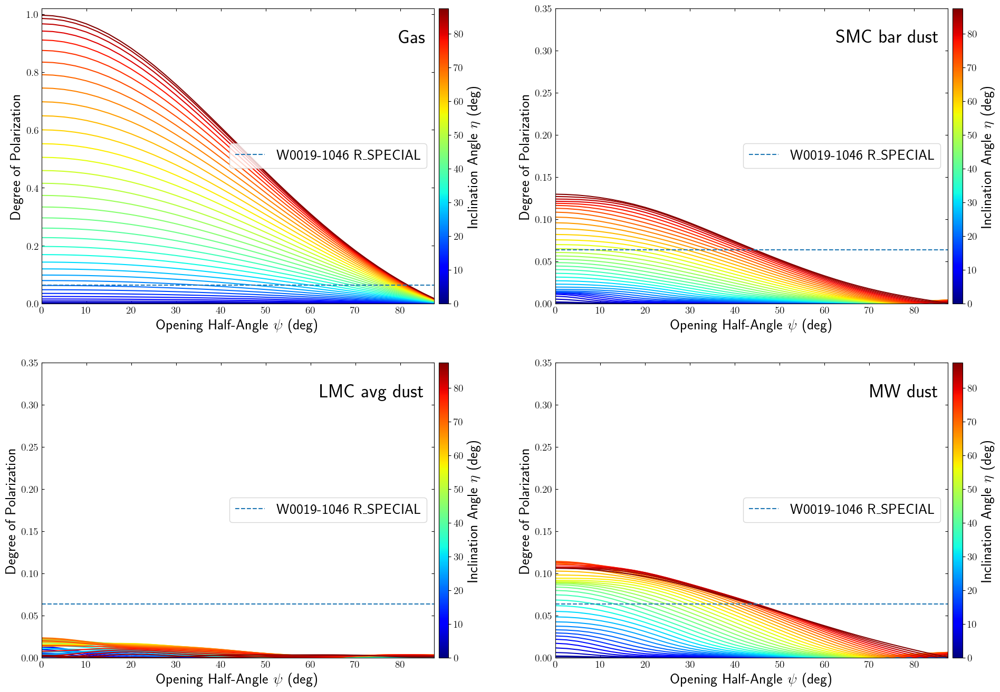

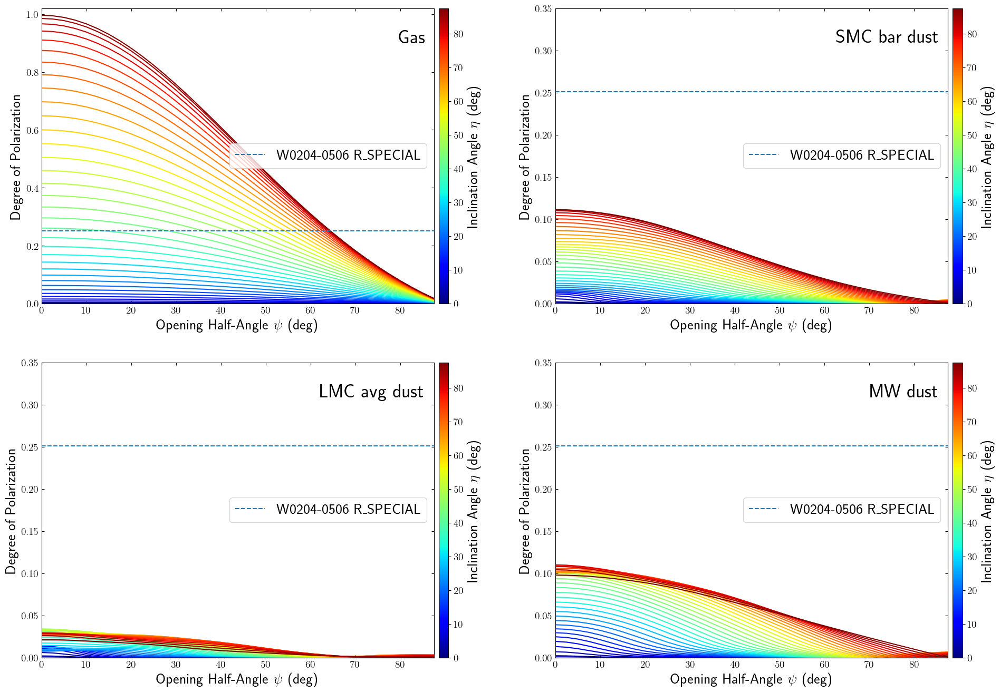

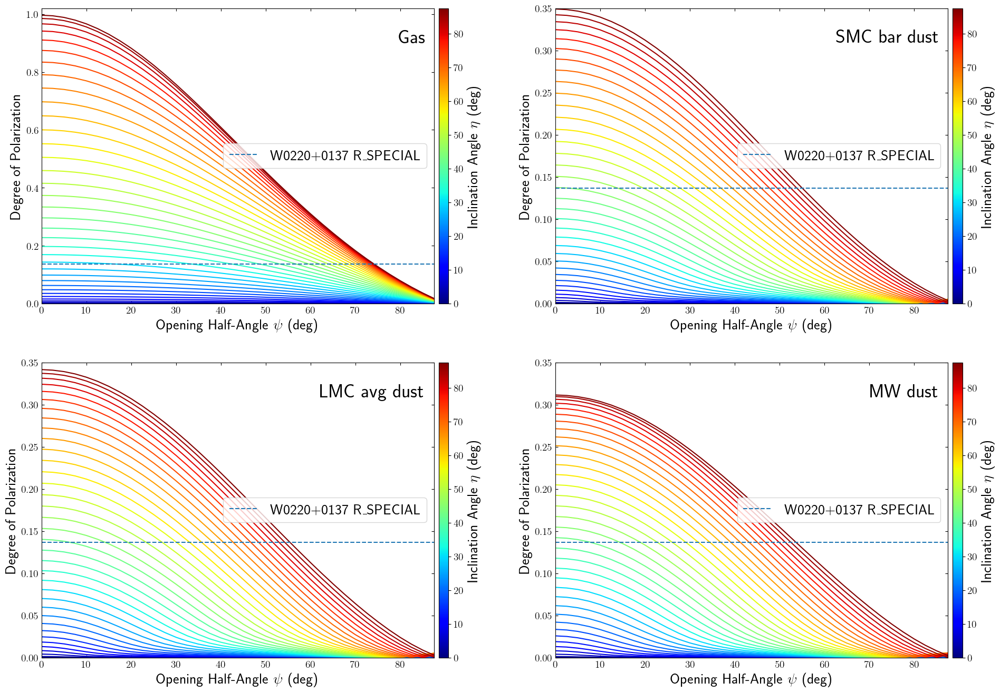

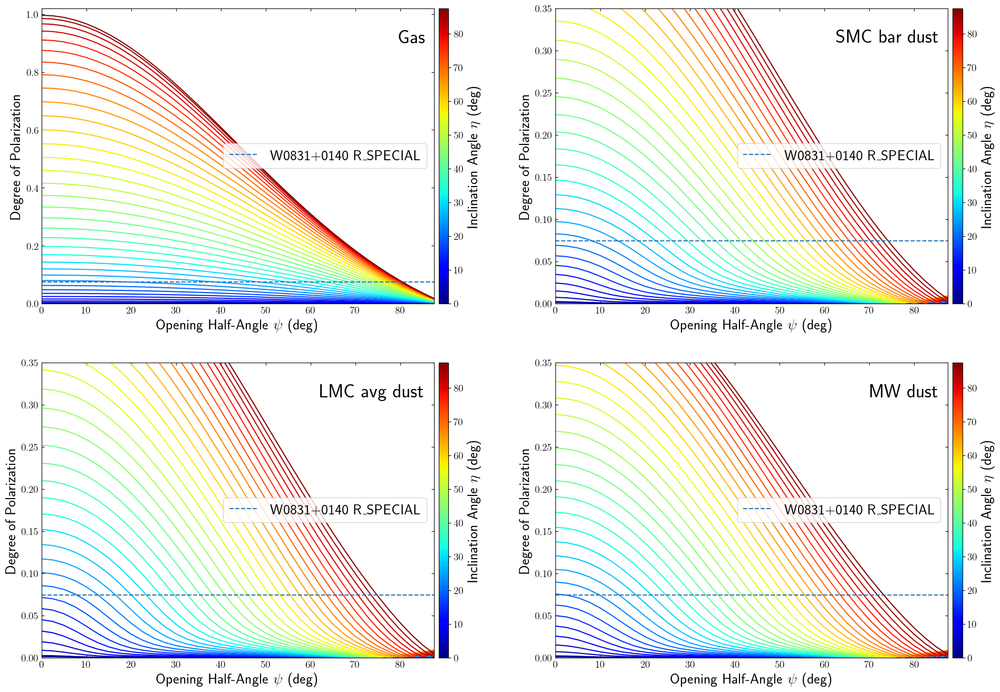

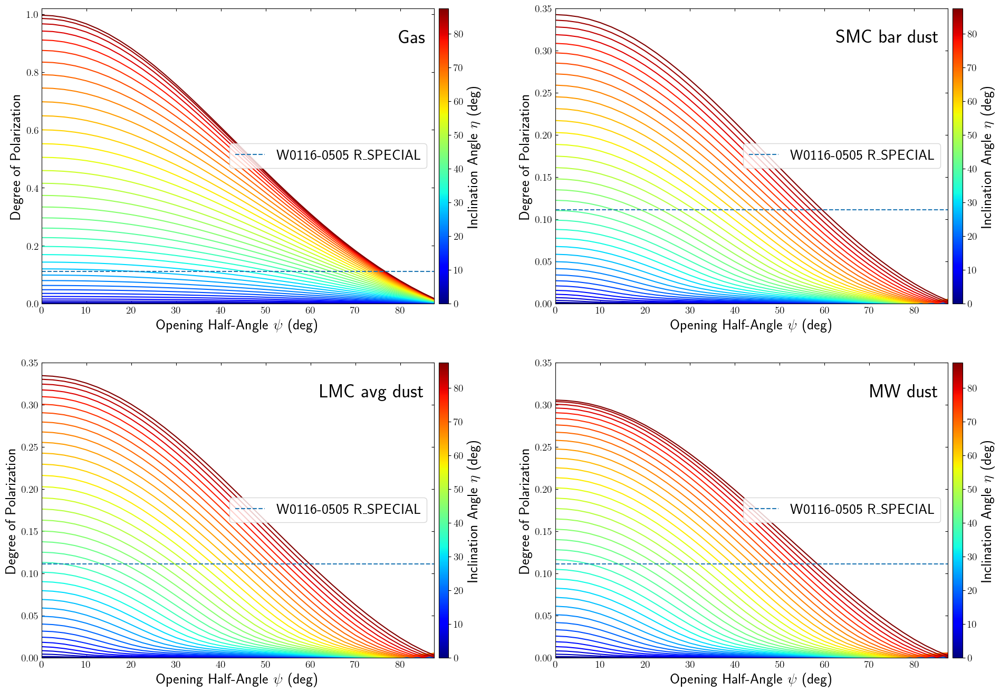

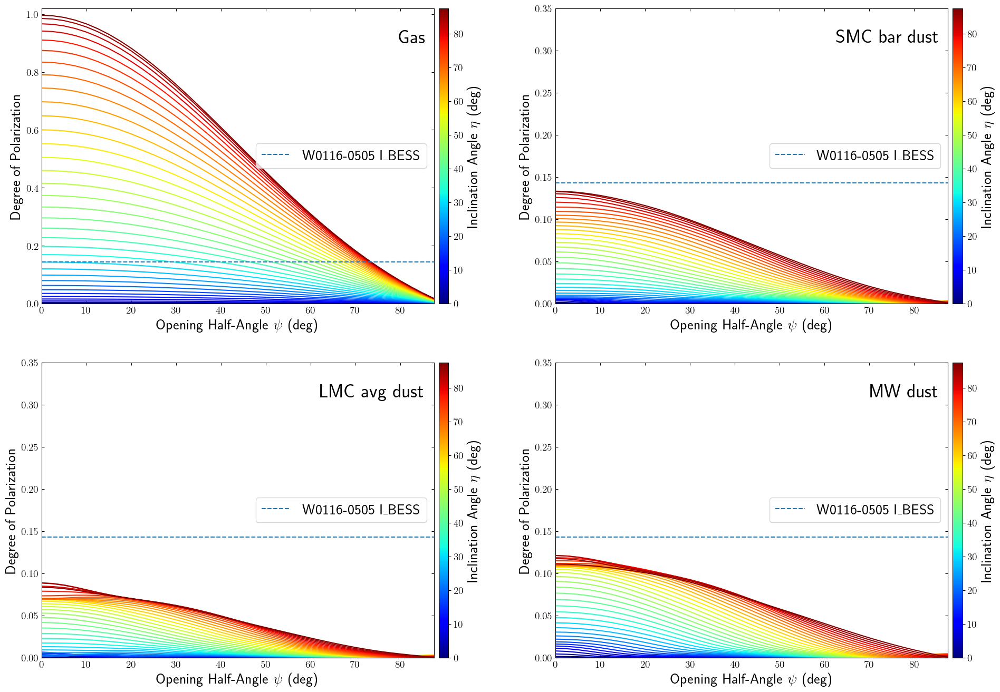

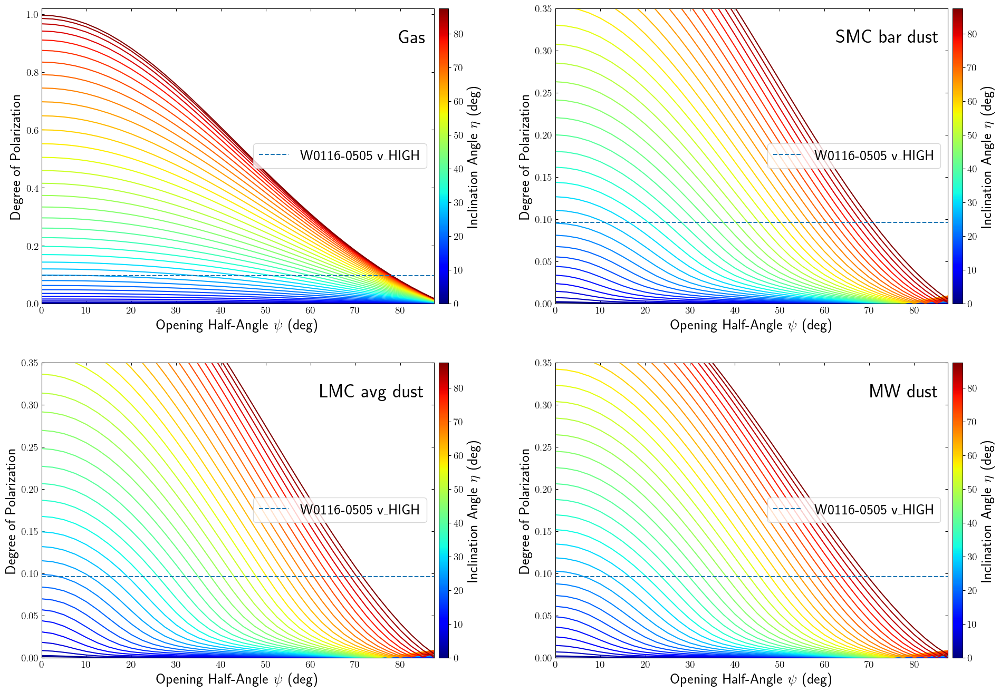

In [12]:
medium_types = ["Gas", "SMC", "LMC", "MW"]
plot_labels = ["Gas", "SMC bar dust", "LMC avg dust", "MW dust"]
fw = True
bw = False
suffix = "FW"
for wid in op.wids:
    for band in op.pfrac[wid].keys():
        fig, ax = plt.subplots(2,2,figsize=(24, 16))
        fig.subplots_adjust(wspace=0.1)
        ymax = [1.02, 0.35, 0.35, 0.35]
        for k, medium_type in enumerate(medium_types):
            if medium_type=="Gas":
                pw = PolWaveGas(fw=fw,bw=bw)
                psi_2d_grid, th_2d_grid = np.meshgrid(psi_angles, theta_angles)
                p_bb = pw.p((th_2d_grid, psi_2d_grid))
            else:
                pw = PolWaveDust(medium_type,fw=fw,bw=bw)
                p_bb = pw.p_bb(bands.bp[band], theta_angles, psi_angles, specs.lam_obs[wid], specs.flam[wid], specs.specs.sp[wid].zspec)
            plot_pol(p_bb, theta_angles, psi_angles, plot_fname=None, plot_label=plot_labels[k], ymax=ymax[k], fig=fig, ax=ax.flatten()[k])
            # #The detected polarization fraction. 
            # for key in pfrac.keys():
            puse = op.pfrac[wid][band]/100.
            ax.flatten()[k].plot([0, 90], [puse, puse], '--', label=wid+" "+band)
            ax.flatten()[k].legend(loc=7, fontsize=20)
        #plt.savefig("lowdens_combined_pol.{}.{}.{}.png".format(wid,band,suffix), dpi=100, bbox_inches='tight', transparent=False, facecolor='white')
        plt.show()

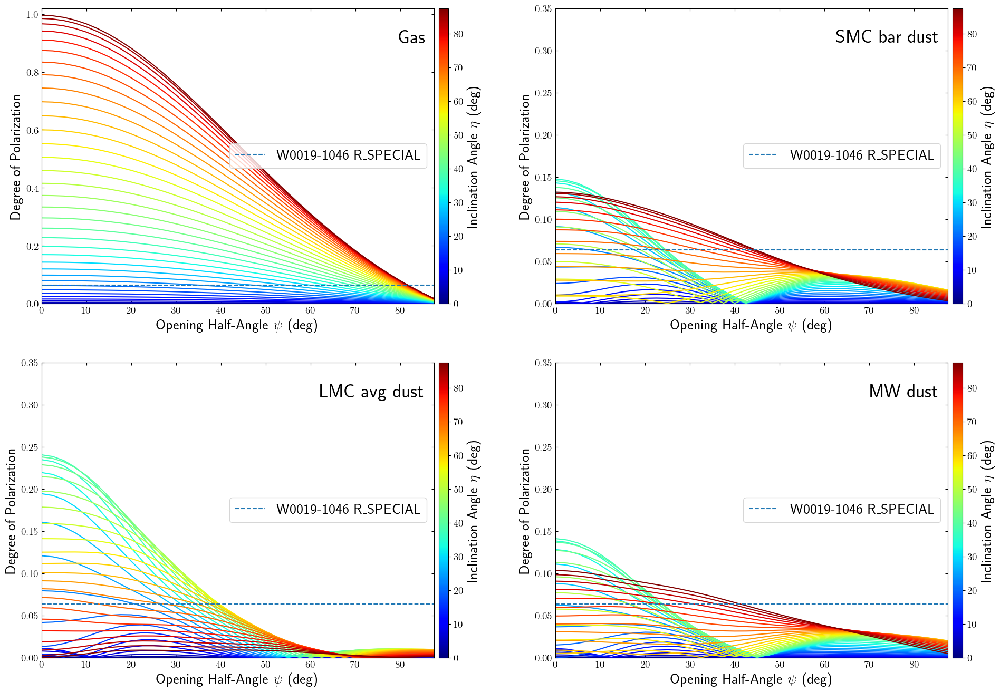

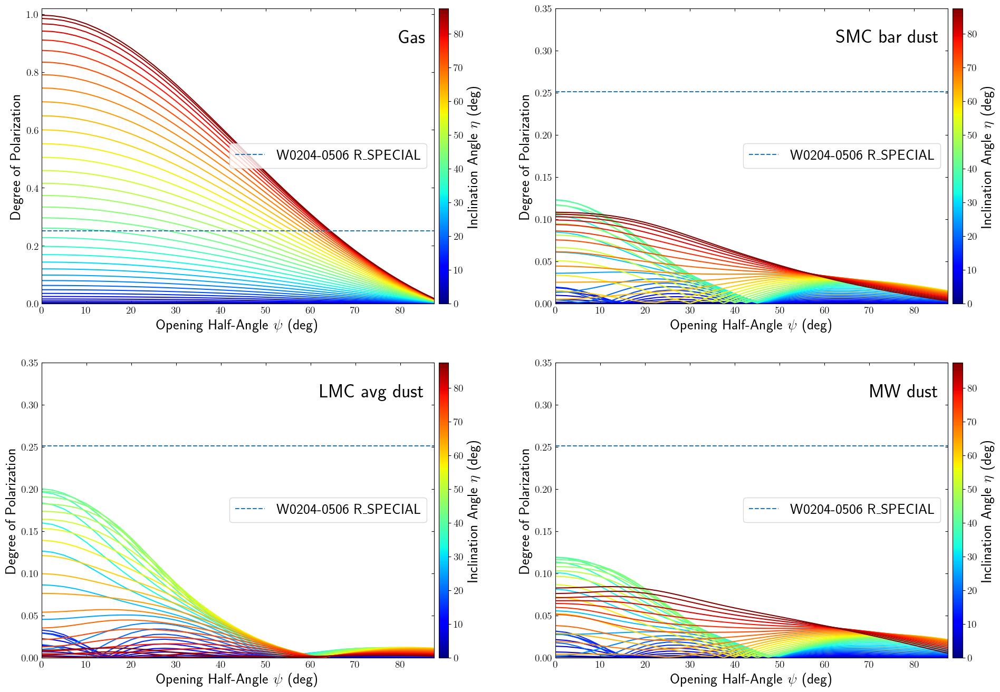

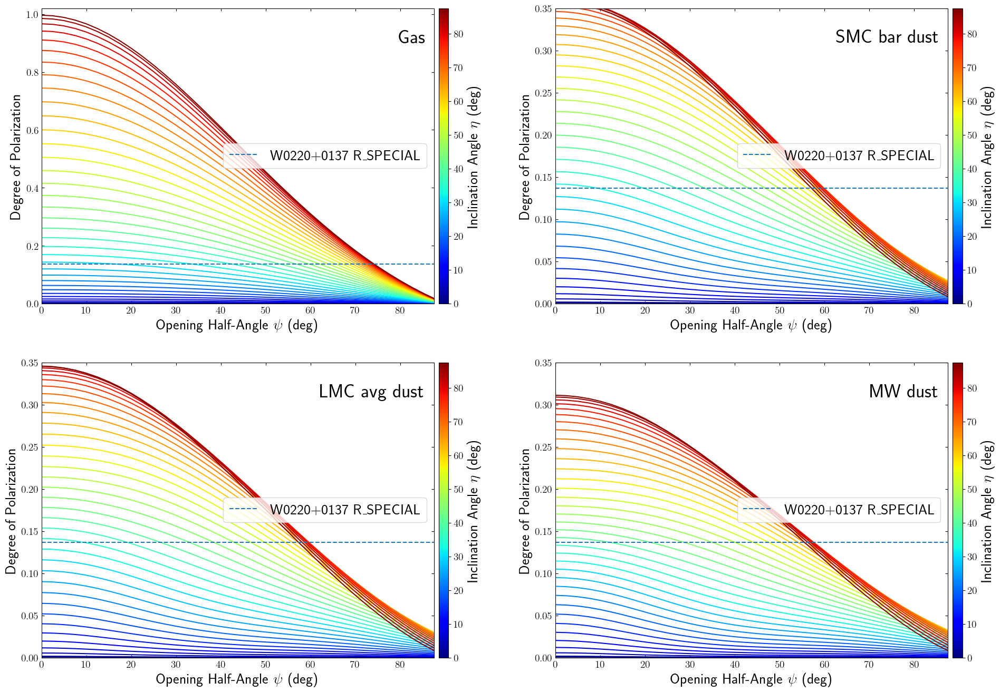

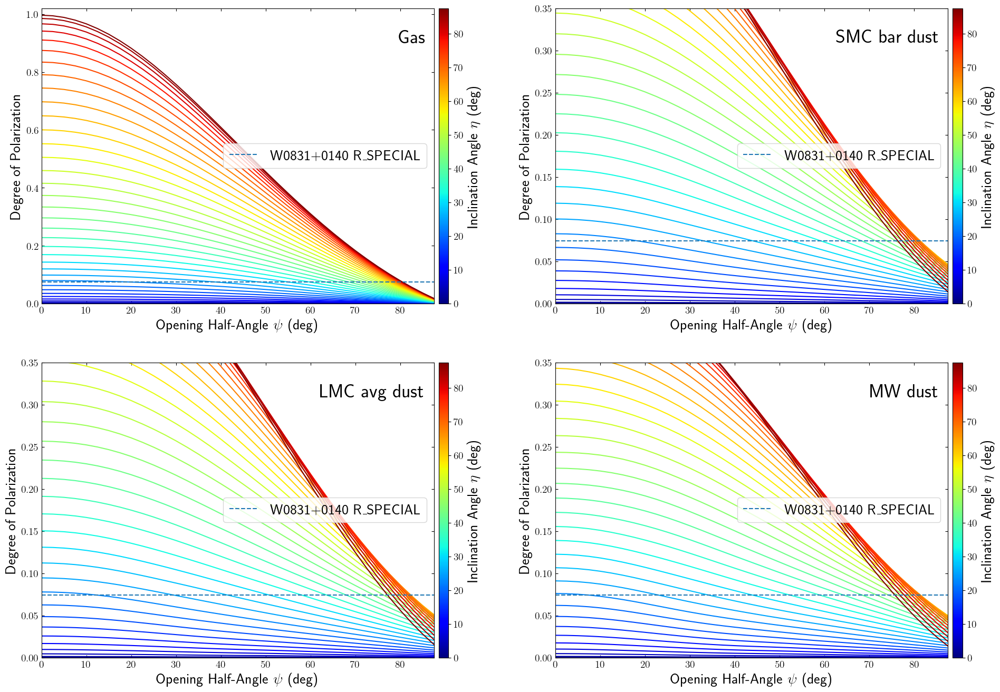

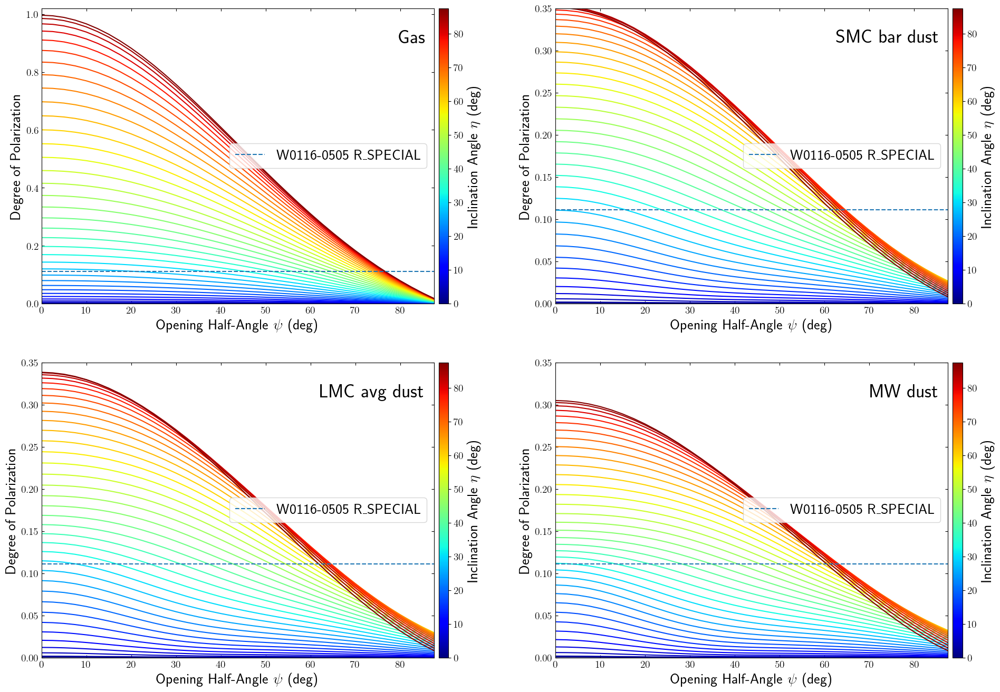

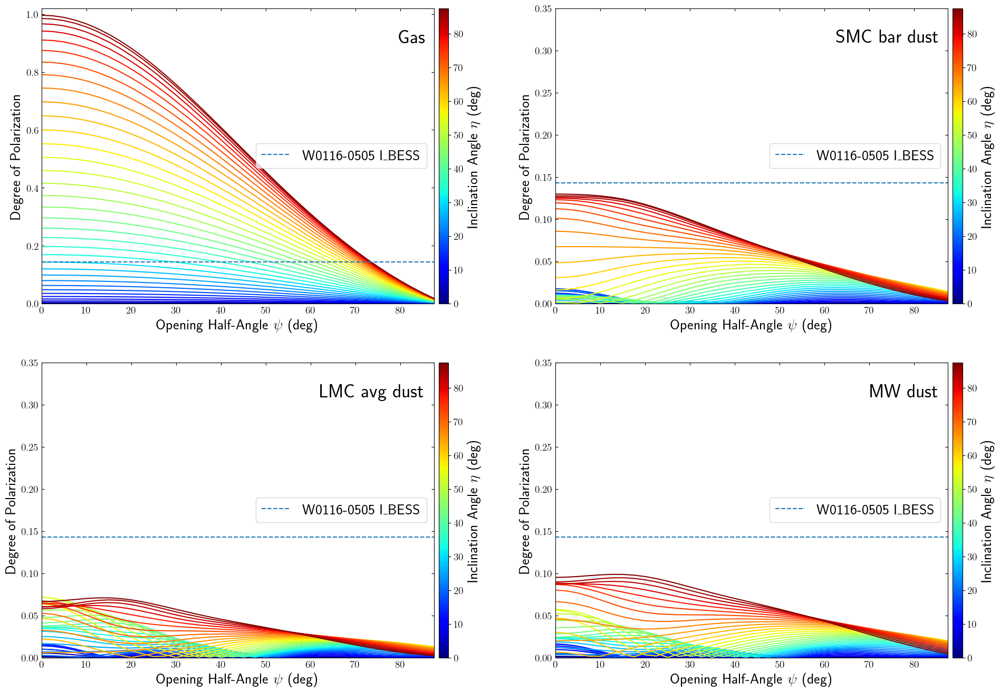

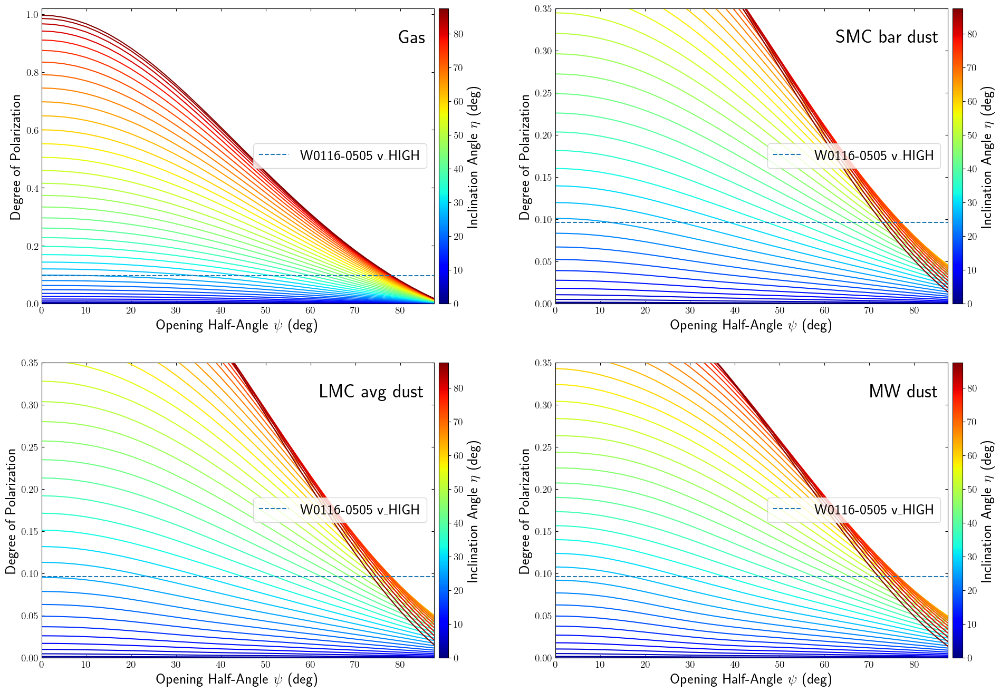

In [11]:
medium_types = ["Gas", "SMC", "LMC", "MW"]
plot_labels = ["Gas", "SMC bar dust", "LMC avg dust", "MW dust"]
fw = False
bw = True
suffix = "BW"
for wid in op.wids:
    for band in op.pfrac[wid].keys():
        fig, ax = plt.subplots(2,2,figsize=(24, 16))
        fig.subplots_adjust(wspace=0.1)
        ymax = [1.02, 0.35, 0.35, 0.35]
        for k, medium_type in enumerate(medium_types):
            if medium_type=="Gas":
                pw = PolWaveGas(fw=fw,bw=bw)
                psi_2d_grid, th_2d_grid = np.meshgrid(psi_angles, theta_angles)
                p_bb = pw.p((th_2d_grid, psi_2d_grid))
            else:
                pw = PolWaveDust(medium_type,fw=fw,bw=bw)
                p_bb = pw.p_bb(bands.bp[band], theta_angles, psi_angles, specs.lam_obs[wid], specs.flam[wid], specs.specs.sp[wid].zspec)
            plot_pol(p_bb, theta_angles, psi_angles, plot_fname=None, plot_label=plot_labels[k], ymax=ymax[k], fig=fig, ax=ax.flatten()[k])
            # #The detected polarization fraction. 
            # for key in pfrac.keys():
            puse = op.pfrac[wid][band]/100.
            ax.flatten()[k].plot([0, 90], [puse, puse], '--', label=wid+" "+band)
            ax.flatten()[k].legend(loc=7, fontsize=20)
        #plt.savefig("lowdens_combined_pol.{}.{}.{}.png".format(wid,band,suffix), dpi=100, bbox_inches='tight', transparent=False, facecolor='white')
        plt.show()